In [ ]:
pip install tensornets

In [ ]:
pip install tensorflow

In [ ]:
pip install opencv-python

In [ ]:
pip install dlib

In [ ]:
pip install -r requirements.txt

ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


In [ ]:
from scipy.spatial import distance as dist
from collections import OrderedDict
import numpy as np
import tensornets as nets
import cv2
import numpy as np
import time
import dlib
import os
import threading
from google.colab.patches import cv2_imshow
import tensorflow.compat.v1 as tf

In [ ]:
tf.test.gpu_device_name()

''

In [ ]:
class CentroidTracker:
    def __init__(self, maxDisappeared=50, maxDistance=50):
        # initialize the next unique object ID along with two dictionaries
        self.nextObjectID = 0
        self.objects = OrderedDict()
        self.disappeared = OrderedDict()
        # number of maximum consecutive frames of disappeared
        self.maxDisappeared = maxDisappeared
        # maximum distance between centroids
        self.maxDistance = maxDistance

    def register(self, centroid):
        self.objects[self.nextObjectID] = centroid
        self.disappeared[self.nextObjectID] = 0
        self.nextObjectID += 1

    def deregister(self, objectID):
        del self.objects[objectID]
        del self.disappeared[objectID]

    def update(self, rects):
        if len(rects) == 0:
            # loop over any existing tracked objects and mark them as disappeared
            for objectID in list(self.disappeared.keys()):
                self.disappeared[objectID] += 1
                # if maximum number of consecutive disappeared frames deregister it
                if self.disappeared[objectID] > self.maxDisappeared:
                    self.deregister(objectID)
            return self.objects

        # initialize an array of input centroids for the current frame
        inputCentroids = np.zeros((len(rects), 2), dtype="int")
        # loop over the bounding box rectangles
        for (i, (startX, startY, endX, endY)) in enumerate(rects):
            # use the bounding box coordinates to derive the centroid
            cX = int((startX + endX) / 2.0)
            cY = int((startY + endY) / 2.0)
            inputCentroids[i] = (cX, cY)

        # if not tracking any objects register them
        if len(self.objects) == 0:
            for i in range(0, len(inputCentroids)):
                self.register(inputCentroids[i])

        else:
            # grab the set of object IDs and corresponding centroids
            objectIDs = list(self.objects.keys())
            objectCentroids = list(self.objects.values())

            # distance between object centroids and input centroids
            D = dist.cdist(np.array(objectCentroids), inputCentroids)
            rows = D.min(axis=1).argsort()
            cols = D.argmin(axis=1)[rows]
            usedRows = set()
            usedCols = set()
            # loop over the combination of the (row, column) index tuples
            for (row, col) in zip(rows, cols):
                if row in usedRows or col in usedCols:
                    continue
                if D[row, col] > self.maxDistance:
                    continue
                objectID = objectIDs[row]
                self.objects[objectID] = inputCentroids[col]
                self.disappeared[objectID] = 0
                usedRows.add(row)
                usedCols.add(col)

            unusedRows = set(range(0, D.shape[0])).difference(usedRows)
            unusedCols = set(range(0, D.shape[1])).difference(usedCols)
            # check and see if some of these objects have disappeared
            if D.shape[0] >= D.shape[1]:
                for row in unusedRows:
                    objectID = objectIDs[row]
                    self.disappeared[objectID] += 1
                    if self.disappeared[objectID] > self.maxDisappeared:
                        self.deregister(objectID)
            # new input centroid as trackable object
            else:
                for col in unusedCols:
                    self.register(inputCentroids[col])

        # return the set of trackable objects
        return self.objects

In [ ]:
class TrackableObject:
    def __init__(self, objectID, centroid):
        # store the object ID, then initialize a list of centroids
        self.objectID = objectID
        self.centroids = [centroid]

        # indicate if the object has already been counted or not
        self.counted = False

Instructions for updating:
non-resource variables are not supported in the long term


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1694: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '


Total no of vehicles: 0


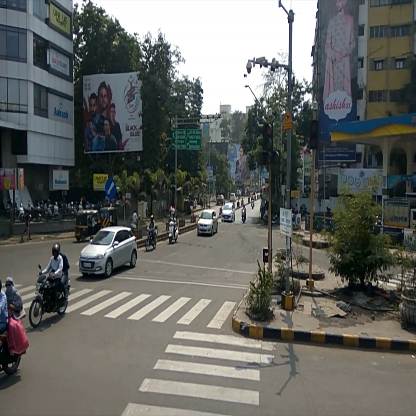

Detection took 1.7224526405334473 seconds
Detected  car  with confidence of  0.9359531
Detected  car  with confidence of  0.97889644
Detected  car  with confidence of  0.46990004
Detected  car  with confidence of  0.99979764
Detected  motorbike  with confidence of  0.74562883
Detected  motorbike  with confidence of  0.9383016
Detected  motorbike  with confidence of  0.6027472
Detected  motorbike  with confidence of  0.97621775
Detected  motorbike  with confidence of  0.78649205
Total no of vehicles: 0


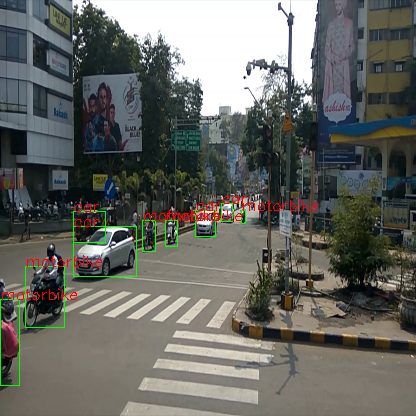

Total no of vehicles: 0


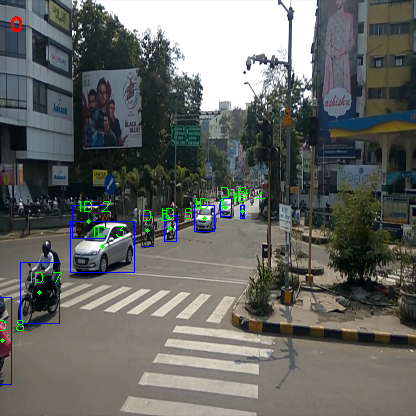

Detection took 1.2449450492858887 seconds
Detected  car  with confidence of  0.4174748
Detected  car  with confidence of  0.9760051
Detected  car  with confidence of  0.7412593
Detected  car  with confidence of  0.9897001
Detected  car  with confidence of  0.9998868
Detected  motorbike  with confidence of  0.85230327
Detected  motorbike  with confidence of  0.7998083
Detected  motorbike  with confidence of  0.9463343
Detected  motorbike  with confidence of  0.9925295
Total no of vehicles: 9


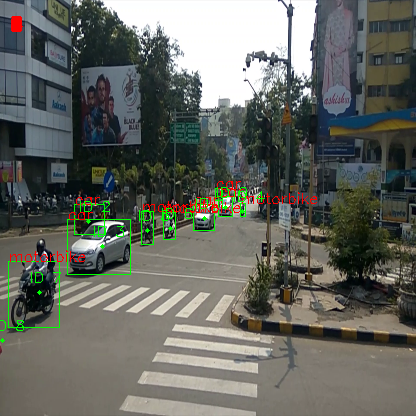

Total no of vehicles: 9


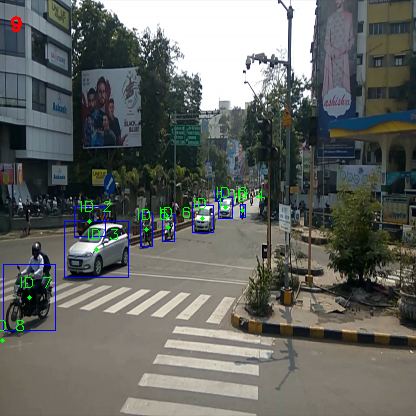

Detection took 1.1836504936218262 seconds
Detected  car  with confidence of  0.9679338
Detected  car  with confidence of  0.9978005
Detected  car  with confidence of  0.9994822
Detected  motorbike  with confidence of  0.8967049
Detected  motorbike  with confidence of  0.44938493
Detected  motorbike  with confidence of  0.97987705
Total no of vehicles: 9


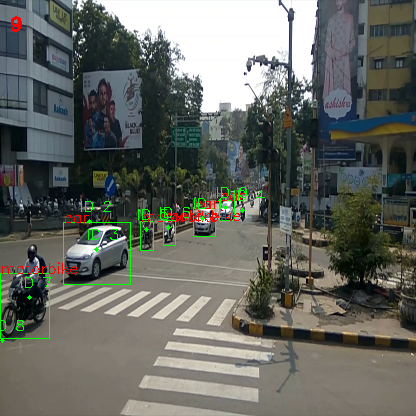

Total no of vehicles: 9


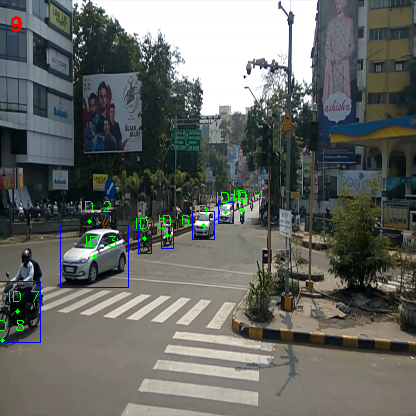

Detection took 1.1782810688018799 seconds
Detected  car  with confidence of  0.980281
Detected  car  with confidence of  0.9934914
Detected  car  with confidence of  0.9998724
Detected  motorbike  with confidence of  0.8856335
Detected  motorbike  with confidence of  0.8819054
Detected  motorbike  with confidence of  0.83730674
Detected  motorbike  with confidence of  0.978073
Total no of vehicles: 9


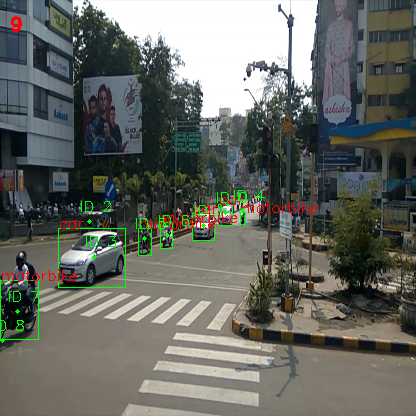

Total no of vehicles: 9


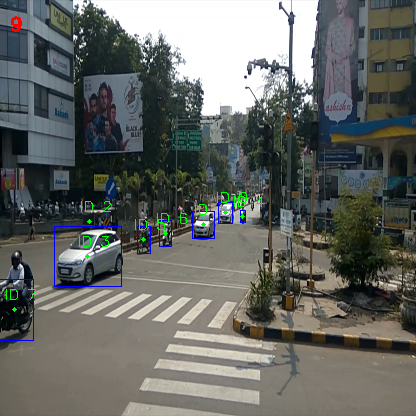

Detection took 1.2217330932617188 seconds
Detected  car  with confidence of  0.9837787
Detected  car  with confidence of  0.9937425
Detected  car  with confidence of  0.99974805
Detected  motorbike  with confidence of  0.8209944
Detected  motorbike  with confidence of  0.78695047
Detected  motorbike  with confidence of  0.8254991
Detected  motorbike  with confidence of  0.9722269
Total no of vehicles: 9


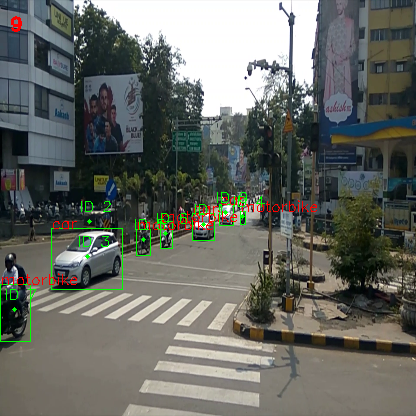

Total no of vehicles: 9


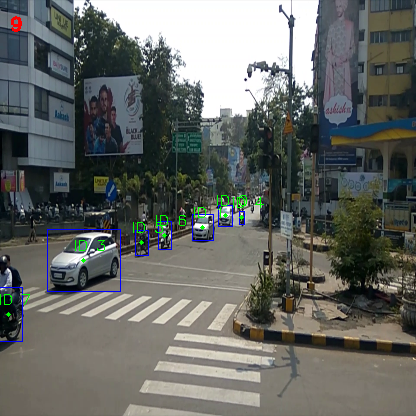

Detection took 1.2504889965057373 seconds
Detected  car  with confidence of  0.9589804
Detected  car  with confidence of  0.99032843
Detected  car  with confidence of  0.9998485
Detected  motorbike  with confidence of  0.6705844
Detected  motorbike  with confidence of  0.88493115
Detected  motorbike  with confidence of  0.885447
Detected  motorbike  with confidence of  0.7969732
Total no of vehicles: 9


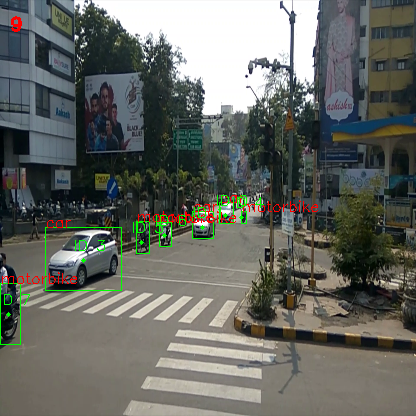

Total no of vehicles: 9


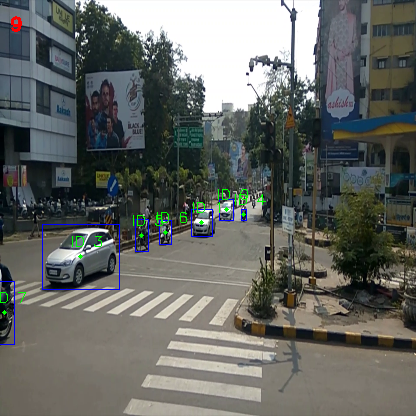

Detection took 1.258836030960083 seconds
Detected  car  with confidence of  0.96207637
Detected  car  with confidence of  0.993562
Detected  car  with confidence of  0.9996769
Detected  motorbike  with confidence of  0.7203382
Detected  motorbike  with confidence of  0.9121288
Detected  motorbike  with confidence of  0.86289763
Total no of vehicles: 9


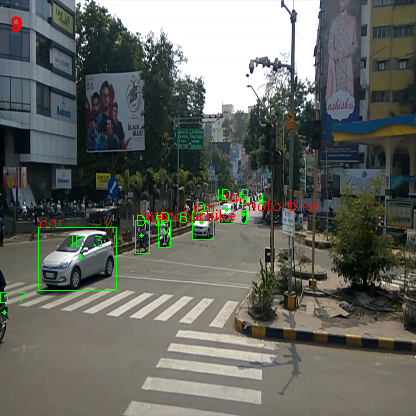

Total no of vehicles: 9


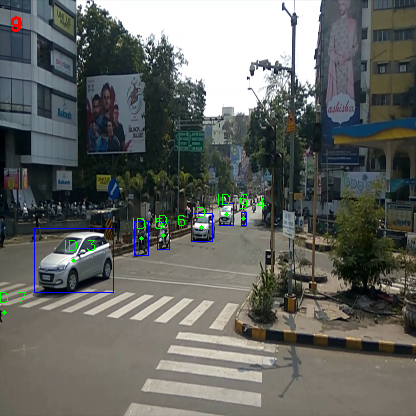

Detection took 1.2546415328979492 seconds
Detected  car  with confidence of  0.9379203
Detected  car  with confidence of  0.99707496
Detected  car  with confidence of  0.9990675
Detected  motorbike  with confidence of  0.7244624
Detected  motorbike  with confidence of  0.9258648
Detected  motorbike  with confidence of  0.75566375
Total no of vehicles: 9


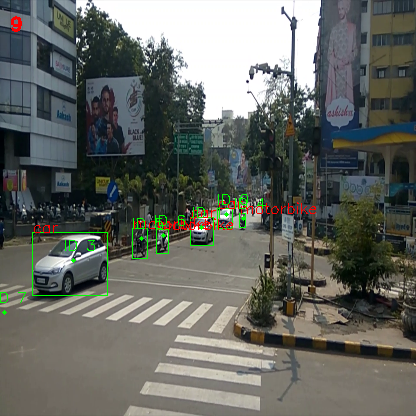

Total no of vehicles: 9


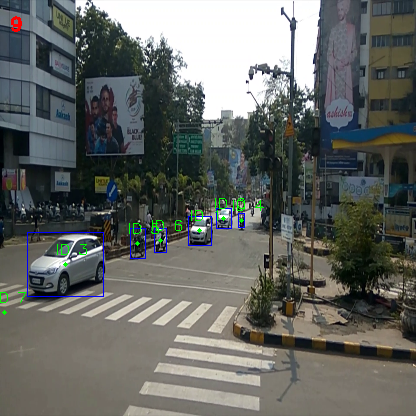

Detection took 1.284714937210083 seconds
Detected  car  with confidence of  0.9797404
Detected  car  with confidence of  0.99616164
Detected  car  with confidence of  0.999545
Detected  motorbike  with confidence of  0.6204214
Detected  motorbike  with confidence of  0.885292
Detected  motorbike  with confidence of  0.6806219
Total no of vehicles: 9


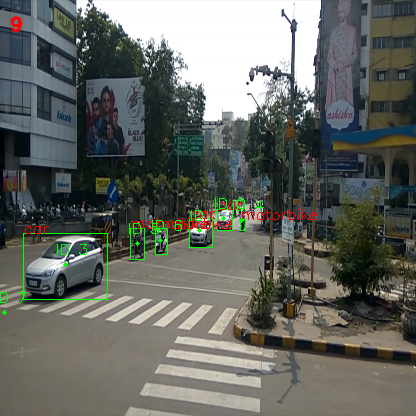

Total no of vehicles: 9


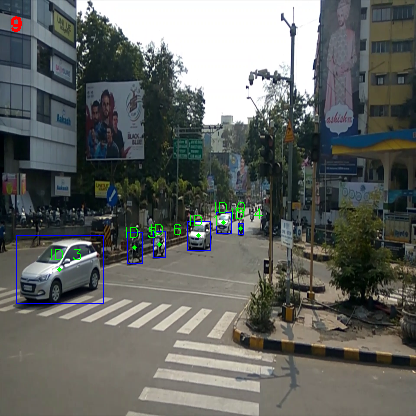

Detection took 1.2888836860656738 seconds
Detected  car  with confidence of  0.9758619
Detected  car  with confidence of  0.9967459
Detected  car  with confidence of  0.999342
Detected  motorbike  with confidence of  0.9423179
Detected  motorbike  with confidence of  0.84085184
Total no of vehicles: 9


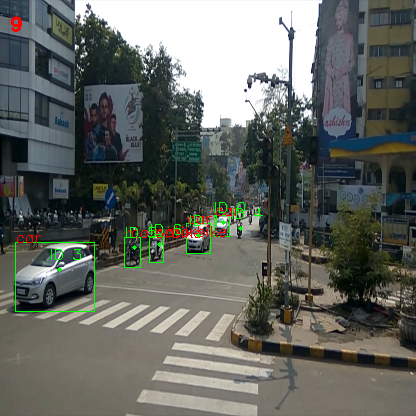

Total no of vehicles: 9


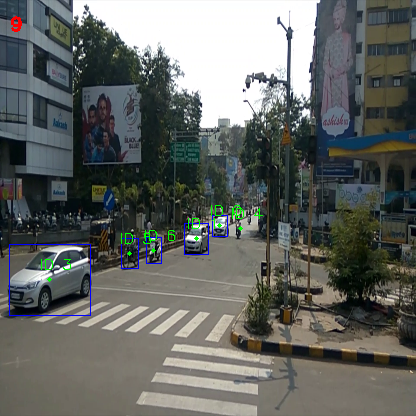

Detection took 1.319061040878296 seconds
Detected  car  with confidence of  0.9789526
Detected  car  with confidence of  0.9949148
Detected  car  with confidence of  0.999376
Detected  motorbike  with confidence of  0.8376352
Detected  motorbike  with confidence of  0.83978665
Detected  motorbike  with confidence of  0.92413193
Total no of vehicles: 9


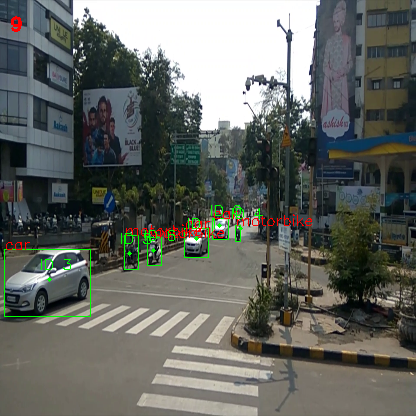

Total no of vehicles: 9


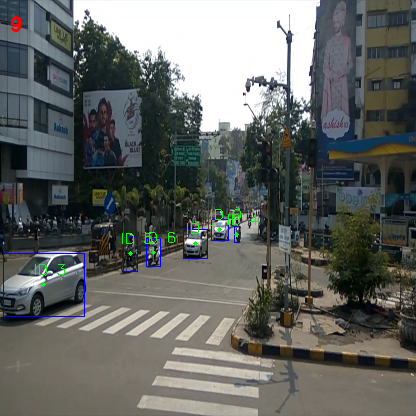

Detection took 1.2811918258666992 seconds
Detected  car  with confidence of  0.9728148
Detected  car  with confidence of  0.9967634
Detected  car  with confidence of  0.9996853
Detected  motorbike  with confidence of  0.7451091
Detected  motorbike  with confidence of  0.9096838
Detected  motorbike  with confidence of  0.701961
Total no of vehicles: 9


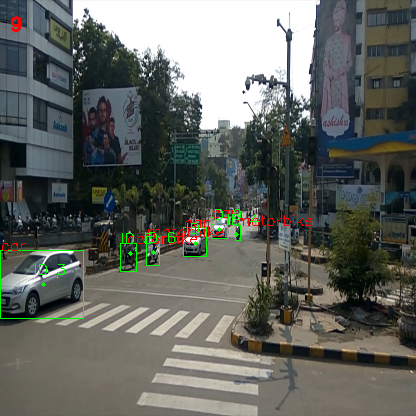

Total no of vehicles: 9


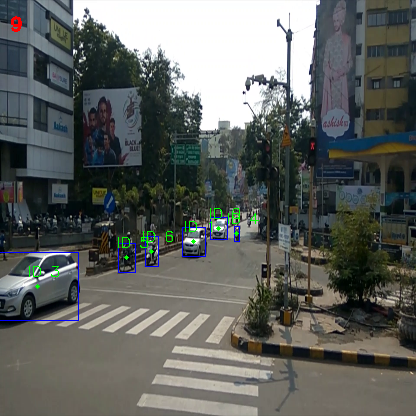

Detection took 1.3271152973175049 seconds
Detected  car  with confidence of  0.969918
Detected  car  with confidence of  0.9979089
Detected  car  with confidence of  0.9967059
Detected  motorbike  with confidence of  0.7036054
Detected  motorbike  with confidence of  0.9615959
Detected  motorbike  with confidence of  0.92442703
Total no of vehicles: 9


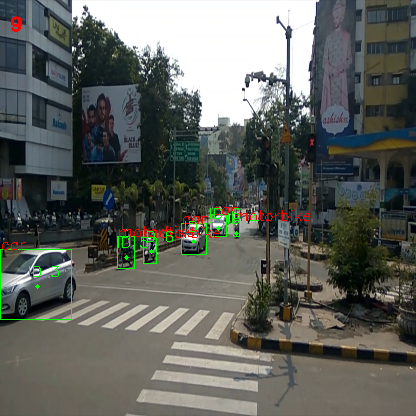

Total no of vehicles: 9


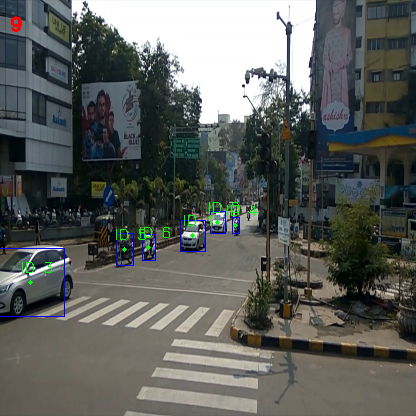

Detection took 1.364366054534912 seconds
Detected  car  with confidence of  0.98601824
Detected  car  with confidence of  0.9980842
Detected  car  with confidence of  0.9979229
Detected  motorbike  with confidence of  0.89271826
Detected  motorbike  with confidence of  0.9496359
Detected  motorbike  with confidence of  0.898986
Total no of vehicles: 9


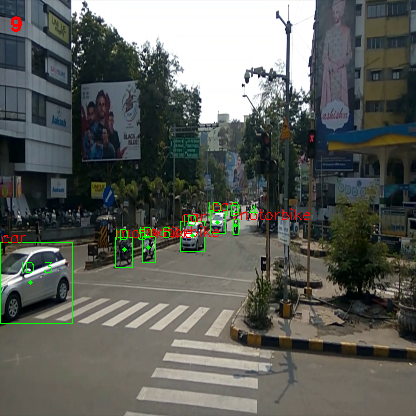

Total no of vehicles: 9


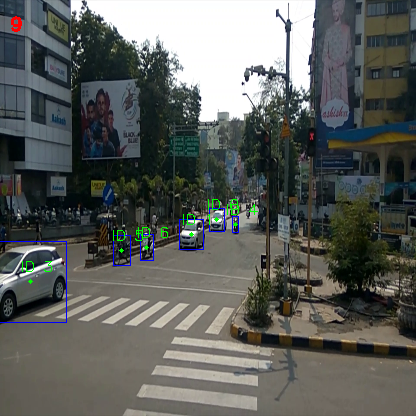

Detection took 1.3912458419799805 seconds
Detected  car  with confidence of  0.98155636
Detected  car  with confidence of  0.99643266
Detected  car  with confidence of  0.9948182
Detected  motorbike  with confidence of  0.6562981
Detected  motorbike  with confidence of  0.60218185
Detected  motorbike  with confidence of  0.918296
Total no of vehicles: 9


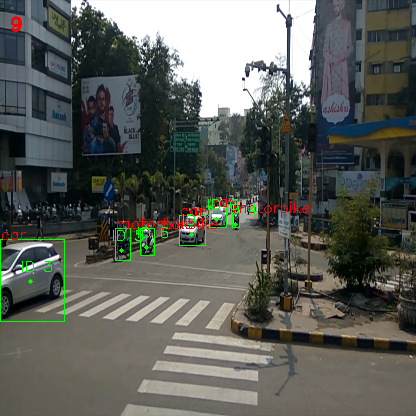

Total no of vehicles: 9


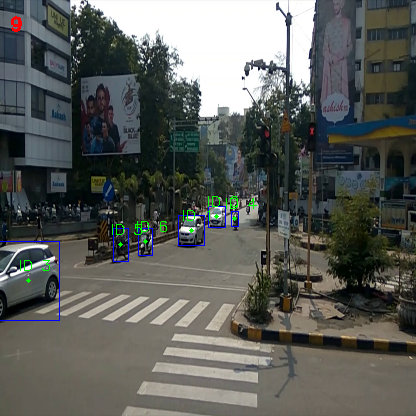

Detection took 1.389045000076294 seconds
Detected  car  with confidence of  0.98731524
Detected  car  with confidence of  0.99861145
Detected  car  with confidence of  0.9866124
Detected  motorbike  with confidence of  0.87622994
Detected  motorbike  with confidence of  0.6443717
Detected  motorbike  with confidence of  0.6713993
Total no of vehicles: 9


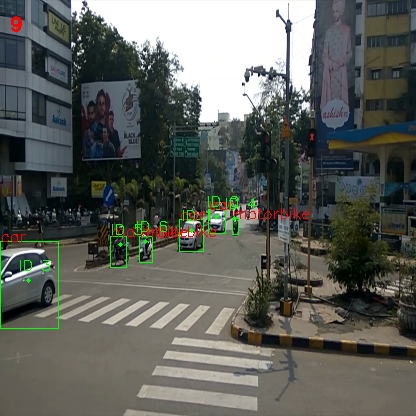

Total no of vehicles: 9


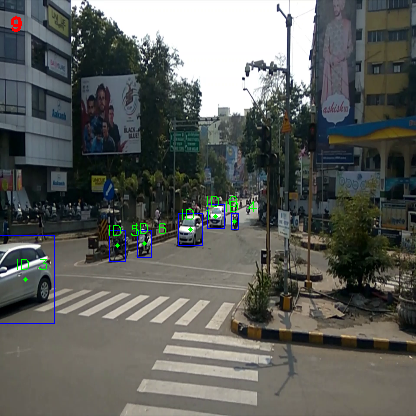

Detection took 1.427628993988037 seconds
Detected  car  with confidence of  0.9853712
Detected  car  with confidence of  0.99465716
Detected  car  with confidence of  0.9860244
Detected  motorbike  with confidence of  0.82709193
Detected  motorbike  with confidence of  0.7612418
Detected  motorbike  with confidence of  0.6561711
Total no of vehicles: 9


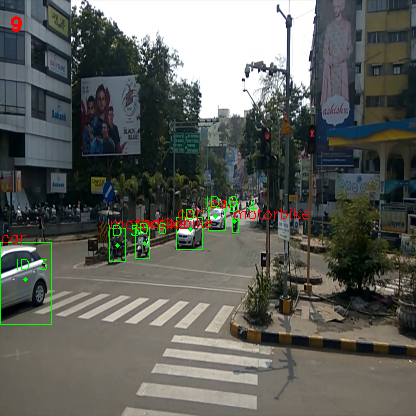

Total no of vehicles: 9


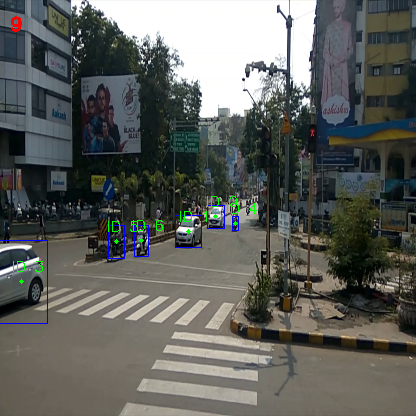

Detection took 1.4366507530212402 seconds
Detected  car  with confidence of  0.9755081
Detected  car  with confidence of  0.9951462
Detected  car  with confidence of  0.970421
Detected  motorbike  with confidence of  0.91798365
Detected  motorbike  with confidence of  0.6380808
Detected  motorbike  with confidence of  0.961906
Total no of vehicles: 9


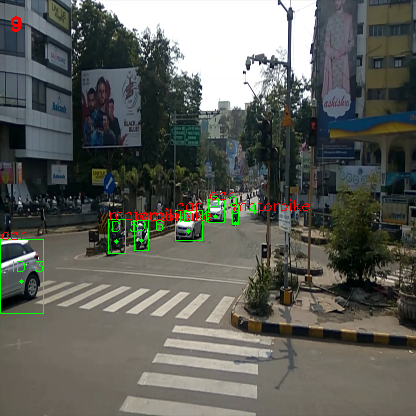

Total no of vehicles: 9


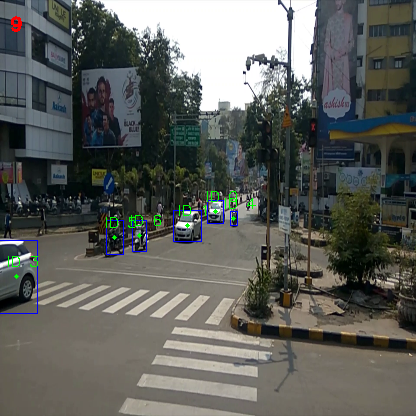

KeyboardInterrupt: ignored

In [ ]:
def countVehicles(param):
    
    with tf.variable_scope("", reuse=tf.AUTO_REUSE) as scope:

        tf.disable_v2_behavior()

        # Image size must be '416x416' as YoloV3 network expects that specific image size as input
        img_size = 416
        inputs = tf.placeholder(tf.float32, [None, img_size, img_size, 3])# variable that we will assign data to at a later date
        model = nets.YOLOv3COCO(inputs, nets.Darknet19)

        ct = CentroidTracker(maxDisappeared=5, maxDistance=50) 
        trackers = [] # List of all dlib trackers
        trackableObjects = {} # Dictionary of trackable objects containing object's ID and its' corresponding centroid/s
        skip_frames = 1 # Numbers of frames to skip from detecting
        confidence_level = 0.40 # The confidence level of a detection
        total = 0 # Total number of detected objects from classes of interest
      
        video_path = os.getcwd() + param
        video_name = os.path.basename(video_path)

        if not os.path.exists(video_path):
            print("File does not exist. Exited.")
            exit()

        # YoloV3 detects 80 classes represented below
        all_classes = ["person", "bicycle", "car", "motorbike", "aeroplane", "bus", "train", "truck", \
                        "boat", "traffic light", "fire hydrant", "stop sign", "parking meter", "bench", \
                        "bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe", \
                        "backpack", "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard", \
                        "sports ball", "kite", "baseball bat", "baseball glove", "skateboard", "surfboard", \
                        "tennis racket", "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana", \
                        "apple", "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake", \
                        "chair", "sofa", "pottedplant", "bed", "diningtable", "toilet", "tvmonitor", "laptop", "mouse", \
                        "remote", "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator", \
                        "book", "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush"]

        # Classes of interest (with their corresponding indexes for easier looping)
        classes = { 1 : 'bicycle', 2 : 'car', 3 : 'motorbike', 5 : 'bus', 7 : 'truck' }

        with tf.Session() as sess:
            sess.run(model.pretrained())
            cap = cv2.VideoCapture(video_path)

            # Get video size 
            width =  int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
            height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

            # Scale used for output window size and net size
            width_scale = 1
            height_scale = 1

            def drawRectangleCV2(img, pt1, pt2, color, thickness, width_scale=width_scale, height_scale=height_scale):
                point1 = (int(pt1[0] * width_scale), int(pt1[1] * height_scale))
                point2 = (int(pt2[0] * width_scale), int(pt2[1] * height_scale))
                return cv2.rectangle(img, point1, point2, color, thickness)

            def drawTextCV2(img, text, pt, font, font_scale, color, lineType, width_scale=width_scale, height_scale=height_scale):
                pt = (int(pt[0] * width_scale), int(pt[1] * height_scale))
                cv2.putText(img, text, pt, font, font_scale, color, lineType)

            def drawCircleCV2(img, center, radius, color, thickness, width_scale=width_scale, height_scale=height_scale):
                center = (int(center[0] * width_scale), int(center[1] * height_scale))
                cv2.circle(img, center, radius, color, thickness)

            skipped_frames_counter = 0

            while(cap.isOpened()):
                try :
                    ret, frame = cap.read()
                    img = cv2.resize(frame, (img_size, img_size))
                except:
                    print(total_str)

                output_img =img
                tracker_rects = []

                if skipped_frames_counter == skip_frames:
                
                    # Detecting happens after number of frames have passes specified by 'skip_frames' variable value
                    trackers = []
                    skipped_frames_counter = 0 # reset counter

                    np_img = np.array(img).reshape(-1, img_size, img_size, 3)

                    start_time=time.time()
                    predictions = sess.run(model.preds, {inputs: model.preprocess(np_img)})
                    print("Detection took %s seconds" % (time.time() - start_time))

                    # model.get_boxes returns a 80 element array containing information about detected classes
                    # each element contains a list of detected boxes, confidence level
                    detections = model.get_boxes(predictions, np_img.shape[1:3])
                    np_detections = np.array(detections,dtype=object)

                    # Loop only through classes we are interested in
                    for class_index in classes.keys():
                        local_count = 0
                        class_name = classes[class_index]

                        # Loop through detected infos of a class we are interested in
                        for i in range(len(np_detections[class_index])):

                            box = np_detections[class_index][i]

                            if np_detections[class_index][i][4] >= confidence_level:
                                print("Detected ", class_name, " with confidence of ", np_detections[class_index][i][4])

                                local_count += 1
                                startX, startY, endX, endY = box[0], box[1], box[2], box[3]
                            
                                drawRectangleCV2(output_img, (startX, startY), (endX, endY), (0, 255, 0), 1)
                                drawTextCV2(output_img, class_name, (startX, startY), cv2.FONT_HERSHEY_SIMPLEX, .5, (0, 0, 255), 1)

                                # Construct a dlib rectangle object from the bounding box coordinates and then start the dlib correlation
                                tracker = dlib.correlation_tracker()
                                rect = dlib.rectangle(int(startX), int(startY), int(endX), int(endY))
                                tracker.start_track(img, rect)

                                # Add the tracker to our list of trackers so we can utilize it during skip frames
                                trackers.append(tracker)

                        # Write the total number of detected objects for a given class on this frame
                        #print(class_name," : ", local_count)
                else:

                    # If detection is not happening then track previously detected objects (if any)                

                    skipped_frames_counter += 1 # Increase the number frames for which we did not use detection

                    # Loop through tracker, update each of them and display their rectangle
                    for tracker in trackers:
                        tracker.update(img)
                        pos = tracker.get_position()

                        # Unpack the position object
                        startX = int(pos.left())
                        startY = int(pos.top())
                        endX = int(pos.right())
                        endY = int(pos.bottom())

                        # Add the bounding box coordinates to the tracking rectangles list
                        tracker_rects.append((startX, startY, endX, endY))

                        # Draw tracking rectangles
                        drawRectangleCV2(output_img, (startX, startY), (endX, endY), (255, 0, 0), 1)

                # Use the centroid tracker to associate the (1) old object centroids with (2) the newly computed object centroids
                objects = ct.update(tracker_rects)

                # Loop over the tracked objects
                for (objectID, centroid) in objects.items():
                    # Check to see if a trackable object exists for the current object ID
                    to = trackableObjects.get(objectID, None)

                    if to is None:
                        # If there is no existing trackable object, create one
                        to = TrackableObject(objectID, centroid)
                    else:
                        to.centroids.append(centroid)

                        # If the object has not been counted, count it and mark it as counted
                        if not to.counted:
                            total += 1
                            to.counted = True

                    # Store the trackable object in our dictionary
                    trackableObjects[objectID] = to

                    # Draw both the ID of the object and the centroid of the object on the output frame
                    object_id = "ID {}".format(objectID)
                    drawTextCV2(output_img, object_id, (centroid[0] - 10, centroid[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)
                    drawCircleCV2(output_img, (centroid[0], centroid[1]), 2, (0, 255, 0), -1)

                    # Display the total count so far
                    total_str = str(total)
                    drawTextCV2(output_img, total_str, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)

                # Display the current frame

                print("Total no of vehicles: "+str(total))
                cv2_imshow(output_img)

                key = cv2.waitKey(1) & 0xFF
                if key  == ord('q'): # QUIT (exits)
                    break
                elif key == ord('p'):
                    cv2.waitKey(0) # PAUSE (Enter any key to continue)

        cap.release()
        cv2.destroyAllWindows()
        print("Exited")

if __name__ == "__main__":
    countVehicles("/3.mp4")
